**LEVEL 1**
 

# **Task 1**
# **Task** : **Data Exploration and preprocessing**

In [1]:
#identity number of rows and columns 
import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv('/kaggle/input/dataset-resturant/Dataset .csv')

# Get the number of rows and columns
rows, columns = df.shape

print(f"Number of rows: {rows}")
print(f"Number of columns: {columns}")


Number of rows: 9551
Number of columns: 21


In [2]:
#identity missing values in each columns
import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv('/kaggle/input/dataset-resturant/Dataset .csv')

# Check for missing values in each column
missing_values = df.isnull().sum()
print("Missing values in each column:")
print(missing_values)



Missing values in each column:
Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [3]:
# Find the most common cuisine
most_common_cuisine = df['Cuisines'].mode()[0]
most_common_cuisine


'North Indian'

In [4]:

# Correct way to fill missing values without chaining
df['Cuisines'] = df['Cuisines'].fillna(most_common_cuisine)

In [5]:

# Check for missing values in each column
missing_values = df.isnull().sum()
print("Missing values in each column:")
print(missing_values)

Missing values in each column:
Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


 **Perform data type conversion if necessary.
 Analyze the distribution of the target variable
 ("Aggregate rating") and identify any class
 imbalances.**


In [6]:
df['Aggregate rating'].dtype

dtype('float64')

In [7]:
#Analyze the distribution of 'Aggregate rating'
rating_distribution = df['Aggregate rating'].value_counts().sort_index()
print("Distribution of 'Aggregate rating':")
print(rating_distribution)

Distribution of 'Aggregate rating':
Aggregate rating
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: count, dtype: int64


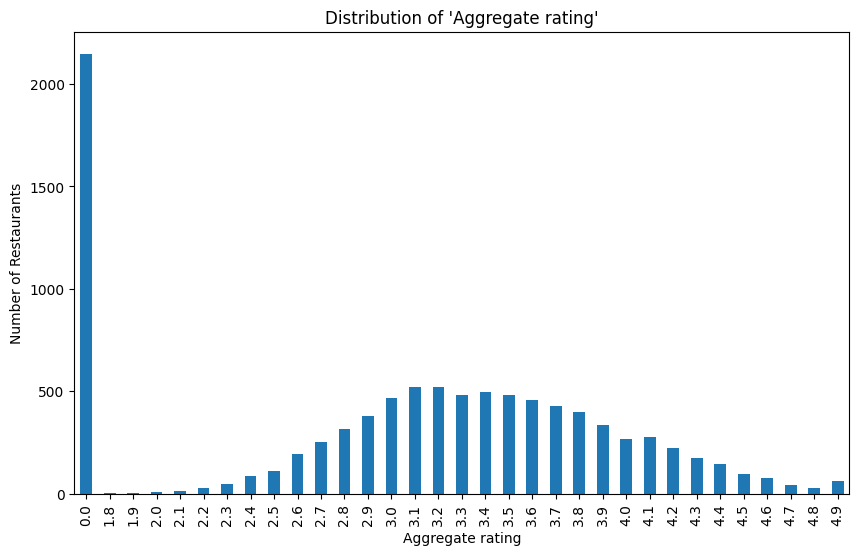

In [8]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
rating_distribution.plot(kind='bar')
plt.title("Distribution of 'Aggregate rating'")
plt.xlabel("Aggregate rating")
plt.ylabel("Number of Restaurants")
plt.show()

# **LEVEL 1** Task 2 : Descriptive Analysis


**Calculate basic statistical measures (mean,
 median, standard deviation, etc.) for numerical
 columns.**

In [9]:
# Identify the numerical columns
numerical_cols = df.select_dtypes(include=['number']).columns

# Display the numerical columns
print("Numerical columns in the dataset:")
print(numerical_cols)

Numerical columns in the dataset:
Index(['Restaurant ID', 'Country Code', 'Longitude', 'Latitude',
       'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes'],
      dtype='object')


In [12]:
numerical_cols = df.select_dtypes(include=['number'])

# Calculate basic statistical measures
statistics = numerical_cols.describe()

# Add median to the statistics
statistics.loc['median'] = numerical_cols.median()

# Display the statistics
print("Basic Statistical Measures for Numerical Columns:")
print(statistics)

Basic Statistical Measures for Numerical Columns:
        Restaurant ID  Country Code    Longitude     Latitude  \
count    9.551000e+03   9551.000000  9551.000000  9551.000000   
mean     9.051128e+06     18.365616    64.126574    25.854381   
std      8.791521e+06     56.750546    41.467058    11.007935   
min      5.300000e+01      1.000000  -157.948486   -41.330428   
25%      3.019625e+05      1.000000    77.081343    28.478713   
50%      6.004089e+06      1.000000    77.191964    28.570469   
75%      1.835229e+07      1.000000    77.282006    28.642758   
max      1.850065e+07    216.000000   174.832089    55.976980   
median   6.004089e+06      1.000000    77.191964    28.570469   

        Average Cost for two  Price range  Aggregate rating         Votes  
count            9551.000000  9551.000000       9551.000000   9551.000000  
mean             1199.210763     1.804837          2.666370    156.909748  
std             16121.183073     0.905609          1.516378    430.1691

**Explore the distribution of categorical
variables like "Country Code,
" "City,
" and
"Cuisines.
"
Identify the top cuisines and cities with the
highest number of restaurants.**


Distribution of Country Codes:
Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64

Distribution of Cities:
City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: count, Length: 141, dtype: int64

Distribution of Cuisines:
Cuisines
North Indian      3969
Chinese           2735
Fast Food         1986
Mughlai            995
Italian            764
                  ... 
Fish and Chips       1
Malwani              1
Cuisine Varies       1
Mineira              1
B�_rek               1
Name: count, Length: 145, dtype: int64

Top Cuisines:
Cuisines
North Indian    3969
Chinese         2735
Fast Food   

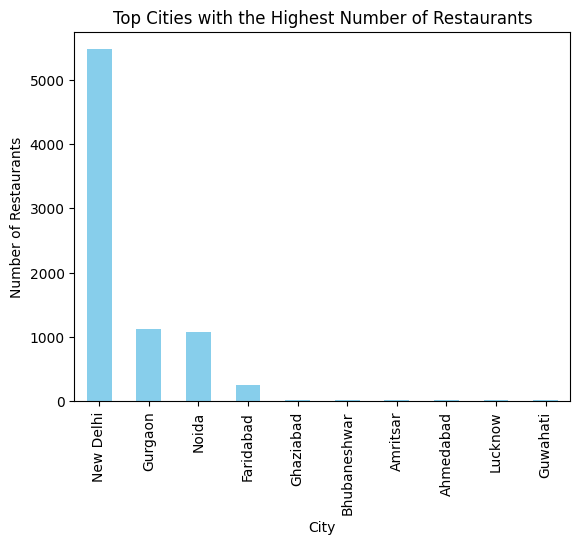

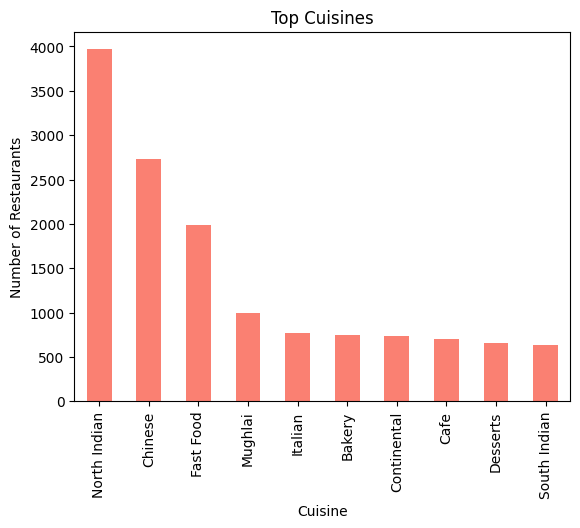

In [13]:
country_distribution = df['Country Code'].value_counts()
print("Distribution of Country Codes:")
print(country_distribution)
city_distribution = df['City'].value_counts()
print("\nDistribution of Cities:")
print(city_distribution)
cuisine_distribution = df['Cuisines'].str.split(', ').explode().value_counts()
print("\nDistribution of Cuisines:")
print(cuisine_distribution)
top_cuisines = cuisine_distribution.head(10)  # Adjust the number as needed
print("\nTop Cuisines:")
print(top_cuisines)
top_cities = city_distribution.head(10)  # Adjust the number as needed
print("\nTop Cities with the Highest Number of Restaurants:")
print(top_cities)
import matplotlib.pyplot as plt

# Plot top cities
top_cities.plot(kind='bar', title='Top Cities with the Highest Number of Restaurants', color='skyblue')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.show()

# Plot top cuisines
top_cuisines.plot(kind='bar', title='Top Cuisines', color='salmon')
plt.xlabel('Cuisine')
plt.ylabel('Number of Restaurants')
plt.show()


# **Level 1** Task 3 Geospatial Analysis



**Visualize the locations of restaurants on a
map using latitude and longitude
information**


In [14]:
pip install folium


Note: you may need to restart the kernel to use updated packages.


In [15]:
import folium

# Initialize a map centered around the mean latitude and longitude
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Add markers for each restaurant
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'],
    ).add_to(restaurant_map)

# Display the map
restaurant_map


In [16]:
import folium

# Initialize a map centered around the mean latitude and longitude
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12, tiles='OpenStreetMap')

# Add markers for each restaurant
for idx, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Restaurant Name'],
    ).add_to(restaurant_map)

# Display the map
restaurant_map


**Analyze the distribution of restaurants
across different cities or countries.
Determine if there is any correlation
between the restaurant's location and its
rating.**


Top Cities with the Most Restaurants:
City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64

Top Countries with the Most Restaurants:
Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
Name: count, dtype: int64

Average Rating by City:
                 City  Aggregate rating
56         Inner City          4.900000
107       Quezon City          4.800000
73        Makati City          4.650000
95         Pasig City          4.633333
75   Mandaluyong City          4.625000
15         Beechworth          4.600000
67             London          4.535000
123       Taguig City          4.525000
122     Tagaytay City          4.500000
116      Secunderabad          4.500000

Average Rating by Country:
    Country Code  Aggregate

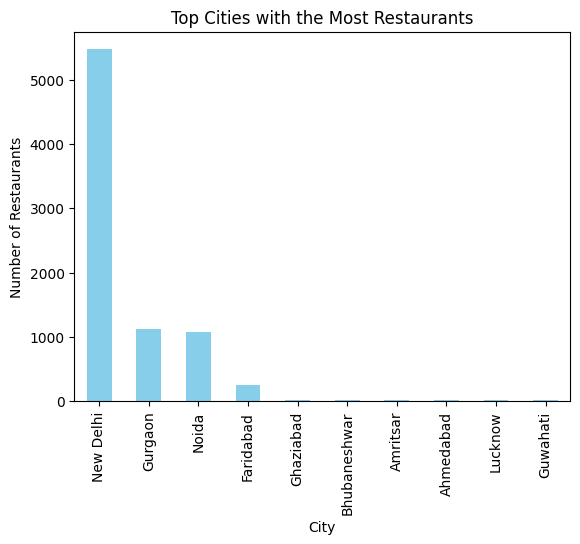

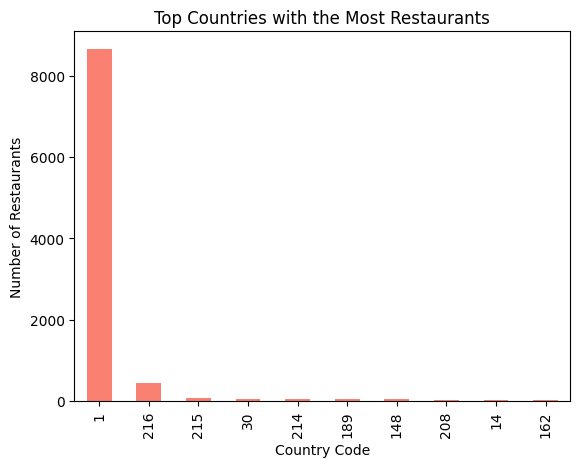

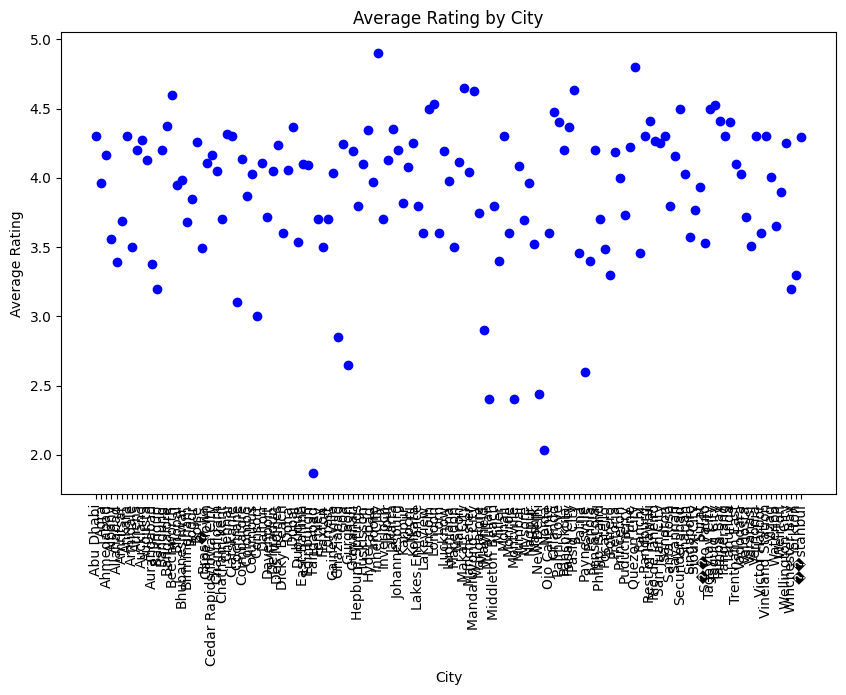

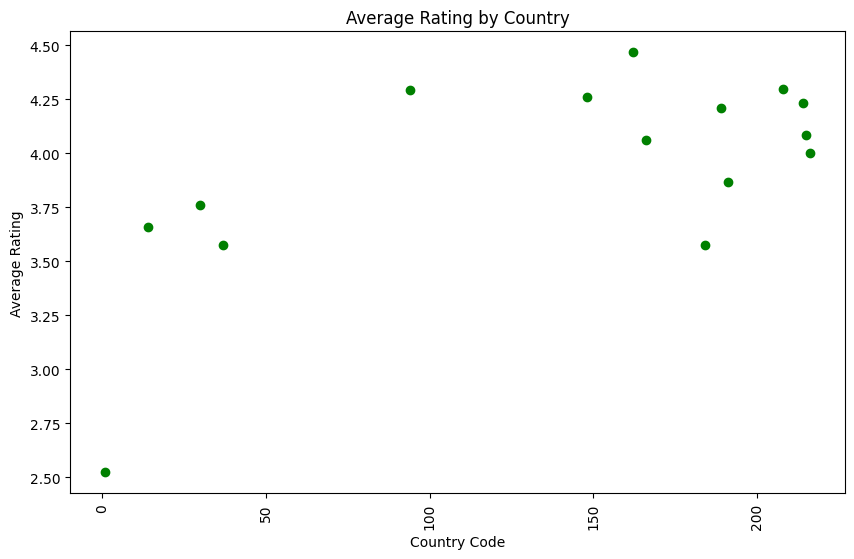


Correlation between the number of restaurants in a city and their average rating: -0.3286275051029894

Correlation between the number of restaurants in a country and their average rating: -0.8065537094557725


In [21]:
import pandas as pd

# Count the number of restaurants in each city
city_distribution = df['City'].value_counts()

# Display the top cities with the most restaurants
print("Top Cities with the Most Restaurants:")
print(city_distribution.head(10))  # Adjust the number of cities displayed as needed
# Count the number of restaurants in each country
country_distribution = df['Country Code'].value_counts()

# Display the top countries with the most restaurants
print("\nTop Countries with the Most Restaurants:")
print(country_distribution.head(10))  # Adjust the number of countries displayed as needed
# Group by city and calculate the mean rating
city_rating_correlation = df.groupby('City')['Aggregate rating'].mean().reset_index()

# Display the correlation between city and average rating
print("\nAverage Rating by City:")
print(city_rating_correlation.sort_values(by='Aggregate rating', ascending=False).head(10))
# Group by country and calculate the mean rating
country_rating_correlation = df.groupby('Country Code')['Aggregate rating'].mean().reset_index()

# Display the correlation between country and average rating
print("\nAverage Rating by Country:")
print(country_rating_correlation.sort_values(by='Aggregate rating', ascending=False).head(10))
import matplotlib.pyplot as plt

# Bar plot for the top cities
city_distribution.head(10).plot(kind='bar', title='Top Cities with the Most Restaurants', color='skyblue')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.show()

# Bar plot for the top countries
country_distribution.head(10).plot(kind='bar', title='Top Countries with the Most Restaurants', color='salmon')
plt.xlabel('Country Code')
plt.ylabel('Number of Restaurants')
plt.show()
# Scatter plot to visualize correlation between city and average rating
plt.figure(figsize=(10, 6))
plt.scatter(city_rating_correlation['City'], city_rating_correlation['Aggregate rating'], color='blue')
plt.title('Average Rating by City')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.xticks(rotation=90)
plt.show()

# Scatter plot to visualize correlation between country and average rating
plt.figure(figsize=(10, 6))
plt.scatter(country_rating_correlation['Country Code'], country_rating_correlation['Aggregate rating'], color='green')
plt.title('Average Rating by Country')
plt.xlabel('Country Code')
plt.ylabel('Average Rating')
plt.xticks(rotation=90)
plt.show()
# Correlation between number of restaurants in a city and their average rating
city_correlation = df.groupby('City').agg({'Aggregate rating': 'mean', 'City': 'count'}).corr().iloc[0, 1]
print(f"\nCorrelation between the number of restaurants in a city and their average rating: {city_correlation}")

# Correlation between number of restaurants in a country and their average rating
country_correlation = df.groupby('Country Code').agg({'Aggregate rating': 'mean', 'Country Code': 'count'}).corr().iloc[0, 1]
print(f"\nCorrelation between the number of restaurants in a country and their average rating: {country_correlation}")


In [18]:
print(df.columns)


Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')


# **Level 2 Task 1** Table Booking and Online Delivery

***Determine the percentage of restaurants that
offer table booking and online delivery.***

In [22]:
# Calculate the total number of restaurants
total_restaurants = len(df)

# Calculate the number of restaurants that offer table booking
table_booking_count = df[df['Has Table booking'] == 'Yes'].shape[0]

# Calculate the percentage of restaurants that offer table booking
table_booking_percentage = (table_booking_count / total_restaurants) * 100

print(f"Percentage of Restaurants Offering Table Booking: {table_booking_percentage:.2f}%")


Percentage of Restaurants Offering Table Booking: 12.12%


In [23]:
# Calculate the number of restaurants that offer online delivery
online_delivery_count = df[df['Has Online delivery'] == 'Yes'].shape[0]

# Calculate the percentage of restaurants that offer online delivery
online_delivery_percentage = (online_delivery_count / total_restaurants) * 100

print(f"Percentage of Restaurants Offering Online Delivery: {online_delivery_percentage:.2f}%")


Percentage of Restaurants Offering Online Delivery: 25.66%


**Compare the average ratings of restaurants
with table booking and those without.**

In [24]:
# Calculate the average rating for restaurants with table booking
average_rating_with_booking = df[df['Has Table booking'] == 'Yes']['Aggregate rating'].mean()

print(f"Average Rating for Restaurants with Table Booking: {average_rating_with_booking:.2f}")
# Calculate the average rating for restaurants without table booking
average_rating_without_booking = df[df['Has Table booking'] == 'No']['Aggregate rating'].mean()

print(f"Average Rating for Restaurants without Table Booking: {average_rating_without_booking:.2f}")
if average_rating_with_booking > average_rating_without_booking:
    print("Restaurants with table booking have a higher average rating.")
elif average_rating_with_booking < average_rating_without_booking:
    print("Restaurants without table booking have a higher average rating.")
else:
    print("Restaurants with and without table booking have the same average rating.")


Average Rating for Restaurants with Table Booking: 3.44
Average Rating for Restaurants without Table Booking: 2.56
Restaurants with table booking have a higher average rating.


**Analyze the availability of online delivery
among restaurants with different price ranges.**


Has Online delivery    No   Yes
Price range                    
1                    3743   701
2                    1827  1286
3                     997   411
4                     533    53
Has Online delivery   Yes    No  Online Delivery %
Price range                                       
1                     701  3743          15.774077
2                    1286  1827          41.310633
3                     411   997          29.190341
4                      53   533           9.044369


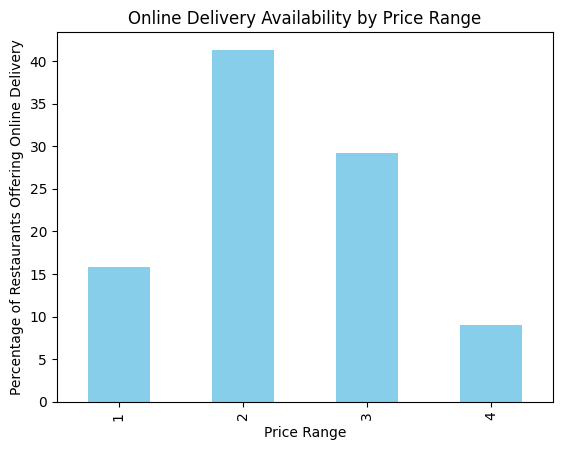

In [25]:
# Group the data by 'Price range' and 'Has Online delivery'
price_range_delivery = df.groupby(['Price range', 'Has Online delivery']).size().unstack(fill_value=0)

# Display the grouped data
print(price_range_delivery)
# Calculate the percentage of restaurants offering online delivery in each price range
price_range_delivery['Online Delivery %'] = (price_range_delivery['Yes'] / (price_range_delivery['Yes'] + price_range_delivery['No'])) * 100

# Display the percentage of restaurants offering online delivery
print(price_range_delivery[['Yes', 'No', 'Online Delivery %']])
import matplotlib.pyplot as plt

# Plot the percentage of online delivery across different price ranges
price_range_delivery['Online Delivery %'].plot(kind='bar', color='skyblue', title='Online Delivery Availability by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Percentage of Restaurants Offering Online Delivery')
plt.show()


# Level 2
# Task 2 Task: Price Range Analysis

**Determine the most common price range
among all the restaurants**

In [26]:
# Count the occurrences of each price range
price_range_counts = df['Price range'].value_counts()

# Display the most common price range
most_common_price_range = price_range_counts.idxmax()
most_common_price_range_count = price_range_counts.max()

print(f"The most common price range is '{most_common_price_range}' with {most_common_price_range_count} restaurants.")


The most common price range is '1' with 4444 restaurants.


**Calculate the average rating for each price
range.**

In [28]:
# Group by 'Price range' and calculate the average rating
average_rating_by_price_range = df.groupby('Price range')['Aggregate rating'].mean().reset_index()

# Display the average rating for each price range
print(average_rating_by_price_range)


   Price range  Aggregate rating
0            1          1.999887
1            2          2.941054
2            3          3.683381
3            4          3.817918


**Identify the color that represents the highest
average rating among different price ranges.
**

In [29]:
# Group by 'Price range' and calculate the average rating and corresponding rating color
rating_color_by_price_range = df.groupby('Price range').agg({
    'Aggregate rating': 'mean',
    'Rating color': 'first'  # Assuming each price range has a consistent rating color
}).reset_index()

# Display the results
print(rating_color_by_price_range)
# Find the row with the highest average rating
highest_avg_rating_row = rating_color_by_price_range.loc[rating_color_by_price_range['Aggregate rating'].idxmax()]

# Extract the color and the average rating
highest_avg_rating_color = highest_avg_rating_row['Rating color']
highest_avg_rating = highest_avg_rating_row['Aggregate rating']

print(f"The color that represents the highest average rating is '{highest_avg_rating_color}' with an average rating of {highest_avg_rating:.2f}.")


   Price range  Aggregate rating Rating color
0            1          1.999887       Yellow
1            2          2.941054   Dark Green
2            3          3.683381   Dark Green
3            4          3.817918        Green
The color that represents the highest average rating is 'Green' with an average rating of 3.82.


# Level 2
# Task 3 Feature Engineering

**Extract additional features from the existing
columns, such as the length of the restaurant
name or address.**

In [30]:
# Create a new column for the length of the restaurant name
df['Name Length'] = df['Restaurant Name'].apply(len)

# Display the first few rows to verify
print(df[['Restaurant Name', 'Name Length']].head())
# Create a new column for the length of the address
df['Address Length'] = df['Address'].apply(len)

# Display the first few rows to verify
print(df[['Address', 'Address Length']].head())
# Create a new column for the number of cuisines
df['Number of Cuisines'] = df['Cuisines'].apply(lambda x: len(x.split(', ')))

# Display the first few rows to verify
print(df[['Cuisines', 'Number of Cuisines']].head())
# Example: Create binary features for specific cities
cities_of_interest = ['New York', 'Los Angeles', 'Chicago']
for city in cities_of_interest:
    df[f'City_{city.replace(" ", "_")}'] = (df['City'] == city).astype(int)

# Example: Create binary features for specific countries
countries_of_interest = ['US', 'IN', 'CN']
for country in countries_of_interest:
    df[f'Country_{country}'] = (df['Country Code'] == country).astype(int)

# Display the first few rows to verify
print(df.head())


          Restaurant Name  Name Length
0        Le Petit Souffle           16
1        Izakaya Kikufuji           16
2  Heat - Edsa Shangri-La           22
3                    Ooma            4
4             Sambo Kojin           11
                                             Address  Address Length
0  Third Floor, Century City Mall, Kalayaan Avenu...              71
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...              67
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...              56
3  Third Floor, Mega Fashion Hall, SM Megamall, O...              70
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...              64
                           Cuisines  Number of Cuisines
0        French, Japanese, Desserts                   3
1                          Japanese                   1
2  Seafood, Asian, Filipino, Indian                   4
3                   Japanese, Sushi                   2
4                  Japanese, Korean                   2
   Restaurant ID

**Create new features like "Has Table Booking"
or "Has Online Delivery" by encoding
categorical variables**

In [31]:
# Convert 'Has Table booking' to binary encoding
df['Has Table Booking'] = df['Has Table booking'].apply(lambda x: 1 if x == 'Yes' else 0)

# Display the first few rows to verify
print(df[['Has Table booking', 'Has Table Booking']].head())
# Convert 'Has Online delivery' to binary encoding
df['Has Online Delivery'] = df['Has Online delivery'].apply(lambda x: 1 if x == 'Yes' else 0)

# Display the first few rows to verify
print(df[['Has Online delivery', 'Has Online Delivery']].head())
# Apply one-hot encoding to the 'City' column
df_encoded = pd.get_dummies(df, columns=['City'])

# Display the first few rows to verify
print(df_encoded.head())


  Has Table booking  Has Table Booking
0               Yes                  1
1               Yes                  1
2               Yes                  1
3                No                  0
4               Yes                  1
  Has Online delivery  Has Online Delivery
0                  No                    0
1                  No                    0
2                  No                    0
3                  No                    0
4                  No                    0
   Restaurant ID         Restaurant Name  Country Code  \
0        6317637        Le Petit Souffle           162   
1        6304287        Izakaya Kikufuji           162   
2        6300002  Heat - Edsa Shangri-La           162   
3        6318506                    Ooma           162   
4        6314302             Sambo Kojin           162   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legas

# Level 3
# Task 1 Predictive Modeling

**Build a regression model to predict the
aggregate rating of a restaurant based on
available features.**

In [38]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score


In [39]:
# Assuming features are already encoded and relevant features are selected
X = df[['Name Length', 'Address Length', 'Number of Cuisines', 'Has Table Booking', 'Has Online Delivery']]  # Example features
y = df['Aggregate rating']
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Initialize and train the regression model
model = LinearRegression()
model.fit(X_train, y_train)
# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
rmse = mse**0.5
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R²): {r2:.2f}")


Mean Squared Error (MSE): 2.04
Root Mean Squared Error (RMSE): 1.43
R-squared (R²): 0.11


**Experiment with different algorithms (e.g.,
linear regression, decision trees, random
forest) and compare their performance.**

In [40]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score


In [41]:
# Assuming features are already encoded and relevant features are selected
X = df[['Name Length', 'Address Length', 'Number of Cuisines', 'Has Table Booking', 'Has Online Delivery']]
y = df['Aggregate rating']
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Initialize and train Linear Regression model
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Make predictions
y_pred_linear = linear_model.predict(X_test)

# Evaluate Linear Regression
mse_linear = mean_squared_error(y_test, y_pred_linear)
rmse_linear = mse_linear**0.5
r2_linear = r2_score(y_test, y_pred_linear)

print(f"Linear Regression - MSE: {mse_linear:.2f}, RMSE: {rmse_linear:.2f}, R²: {r2_linear:.2f}")


Linear Regression - MSE: 2.04, RMSE: 1.43, R²: 0.11


In [42]:
# Initialize and train Decision Tree Regressor
tree_model = DecisionTreeRegressor(random_state=42)
tree_model.fit(X_train, y_train)

# Make predictions
y_pred_tree = tree_model.predict(X_test)

# Evaluate Decision Tree Regressor
mse_tree = mean_squared_error(y_test, y_pred_tree)
rmse_tree = mse_tree**0.5
r2_tree = r2_score(y_test, y_pred_tree)

print(f"Decision Tree Regressor - MSE: {mse_tree:.2f}, RMSE: {rmse_tree:.2f}, R²: {r2_tree:.2f}")


Decision Tree Regressor - MSE: 3.39, RMSE: 1.84, R²: -0.49


In [43]:
# Initialize and train Random Forest Regressor
forest_model = RandomForestRegressor(n_estimators=100, random_state=42)
forest_model.fit(X_train, y_train)

# Make predictions
y_pred_forest = forest_model.predict(X_test)

# Evaluate Random Forest Regressor
mse_forest = mean_squared_error(y_test, y_pred_forest)
rmse_forest = mse_forest**0.5
r2_forest = r2_score(y_test, y_pred_forest)

print(f"Random Forest Regressor - MSE: {mse_forest:.2f}, RMSE: {rmse_forest:.2f}, R²: {r2_forest:.2f}")


Random Forest Regressor - MSE: 2.60, RMSE: 1.61, R²: -0.14


# Level 3
# Task 2  Customer Preference Analysis

**Analyze the relationship between the type of
cuisine and the restaurant's rating.**

In [44]:
# Split the 'Cuisines' column into separate rows for each cuisine
cuisines_df = df[['Restaurant Name', 'Aggregate rating', 'Cuisines']].copy()
cuisines_df = cuisines_df.assign(Cuisines=cuisines_df['Cuisines'].str.split(',')).explode('Cuisines')

# Clean up any leading or trailing spaces in the 'Cuisines' column
cuisines_df['Cuisines'] = cuisines_df['Cuisines'].str.strip()

# Display the first few rows to verify
print(cuisines_df.head())


          Restaurant Name  Aggregate rating  Cuisines
0        Le Petit Souffle               4.8    French
0        Le Petit Souffle               4.8  Japanese
0        Le Petit Souffle               4.8  Desserts
1        Izakaya Kikufuji               4.5  Japanese
2  Heat - Edsa Shangri-La               4.4   Seafood


In [45]:
# Calculate the average rating for each cuisine
cuisine_rating = cuisines_df.groupby('Cuisines')['Aggregate rating'].mean().reset_index()

# Sort cuisines by average rating
cuisine_rating_sorted = cuisine_rating.sort_values(by='Aggregate rating', ascending=False)

# Display the average ratings for each cuisine
print(cuisine_rating_sorted)


           Cuisines  Aggregate rating
130           Sunda          4.900000
26           B�_rek          4.700000
132       Taiwanese          4.650000
112           Ramen          4.500000
43          Dim Sum          4.466667
..              ...               ...
94         Moroccan          1.620000
11           Awadhi          1.572727
6          Armenian          1.300000
90          Mineira          0.000000
39   Cuisine Varies          0.000000

[145 rows x 2 columns]


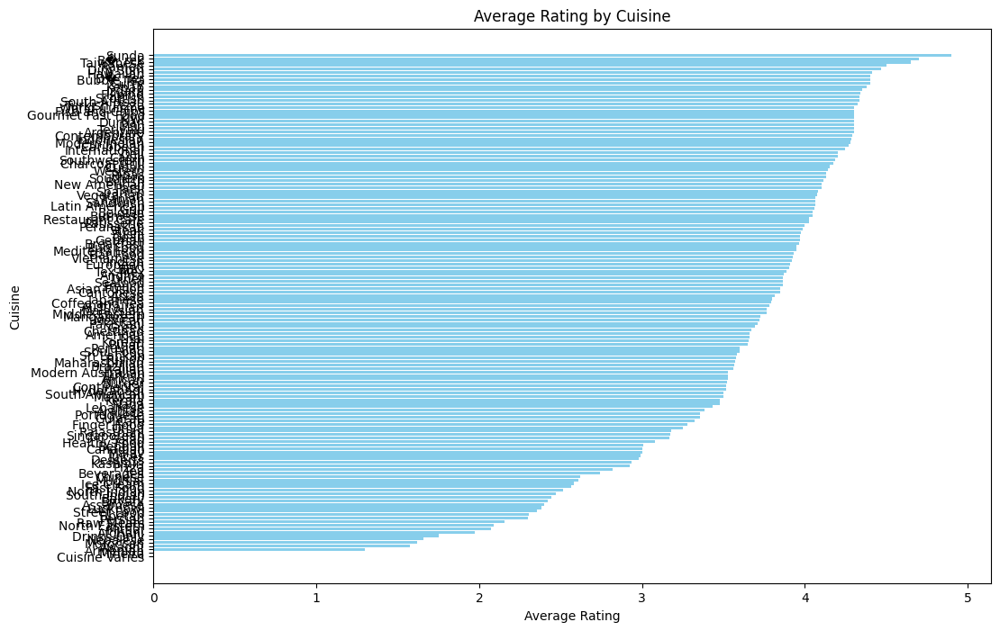

In [50]:
import matplotlib.pyplot as plt

# Plot the average rating by cuisine
plt.figure(figsize=(12, 8))
plt.barh(cuisine_rating_sorted['Cuisines'], cuisine_rating_sorted['Aggregate rating'], color='skyblue')
plt.xlabel('Average Rating')
plt.ylabel('Cuisine')
plt.title('Average Rating by Cuisine')
plt.gca().invert_yaxis()  # Highest ratings at the top
plt.show()


**Identify the most popular cuisines among
customers based on the number of votes.**

          Restaurant Name  Votes  Cuisines
0        Le Petit Souffle    314    French
0        Le Petit Souffle    314  Japanese
0        Le Petit Souffle    314  Desserts
1        Izakaya Kikufuji    591  Japanese
2  Heat - Edsa Shangri-La    270   Seafood
         Cuisines   Votes
100  North Indian  598707
34        Chinese  364351
70        Italian  329265
37    Continental  288255
49      Fast Food  184058
2        American  183117
27           Cafe  177568
95        Mughlai  151946
42       Desserts  105889
7           Asian  104303


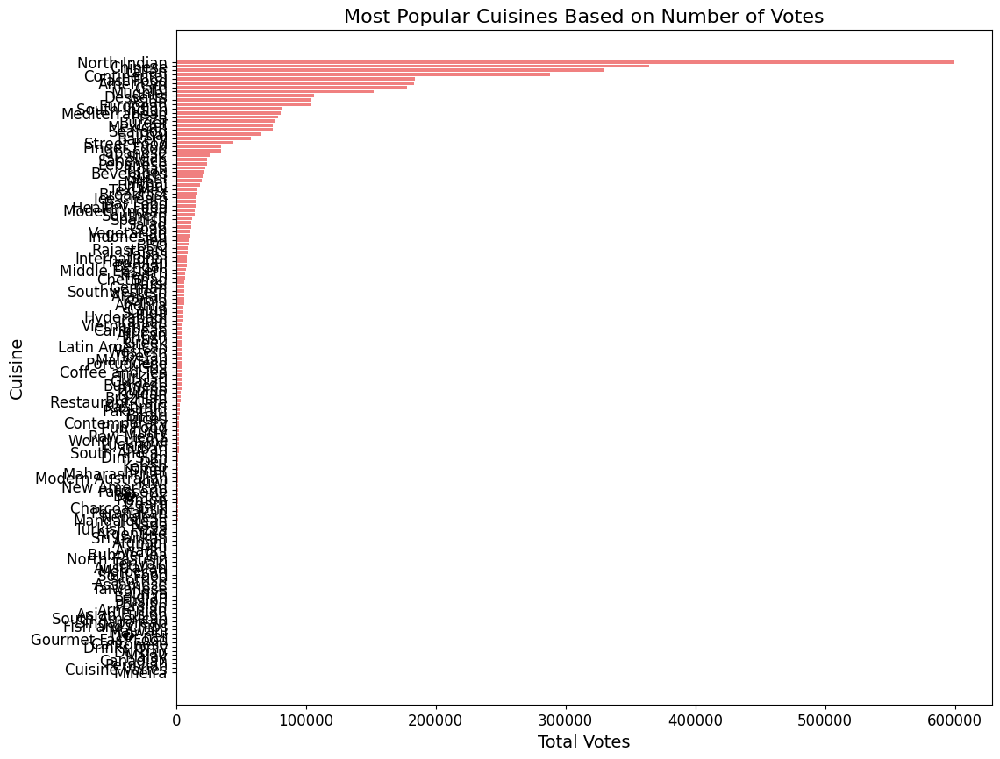

In [52]:
# Split the 'Cuisines' column into separate rows for each cuisine
cuisines_df = df[['Restaurant Name', 'Votes', 'Cuisines']].copy()
cuisines_df = cuisines_df.assign(Cuisines=cuisines_df['Cuisines'].str.split(',')).explode('Cuisines')

# Clean up any leading or trailing spaces in the 'Cuisines' column
cuisines_df['Cuisines'] = cuisines_df['Cuisines'].str.strip()

# Display the first few rows to verify
print(cuisines_df.head())

# Convert 'Votes' to numeric, if it isn't already
cuisines_df['Votes'] = pd.to_numeric(cuisines_df['Votes'], errors='coerce')

# Group by cuisine and sum the votes
cuisine_votes = cuisines_df.groupby('Cuisines')['Votes'].sum().reset_index()

# Sort cuisines by total votes in descending order
cuisine_votes_sorted = cuisine_votes.sort_values(by='Votes', ascending=False)

# Display the most popular cuisines
print(cuisine_votes_sorted.head(10))  # Adjust the number to display more or fewer cuisines
import matplotlib.pyplot as plt

# Plot the number of votes by cuisine
plt.figure(figsize=(12, 10))
plt.barh(cuisine_votes_sorted['Cuisines'], cuisine_votes_sorted['Votes'], color='lightcoral')

# Add labels
plt.xlabel('Total Votes', fontsize=14)
plt.ylabel('Cuisine', fontsize=14)
plt.title('Most Popular Cuisines Based on Number of Votes', fontsize=16)
plt.gca().invert_yaxis()  # Highest votes at the top

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.show()


**Determine if there are any specific cuisines
that tend to receive higher ratings.**

          Restaurant Name  Aggregate rating  Cuisines
0        Le Petit Souffle               4.8    French
0        Le Petit Souffle               4.8  Japanese
0        Le Petit Souffle               4.8  Desserts
1        Izakaya Kikufuji               4.5  Japanese
2  Heat - Edsa Shangri-La               4.4   Seafood
           Cuisines  Aggregate rating
130           Sunda          4.900000
26           B�_rek          4.700000
132       Taiwanese          4.650000
112           Ramen          4.500000
43          Dim Sum          4.466667
..              ...               ...
94         Moroccan          1.620000
11           Awadhi          1.572727
6          Armenian          1.300000
90          Mineira          0.000000
39   Cuisine Varies          0.000000

[145 rows x 2 columns]


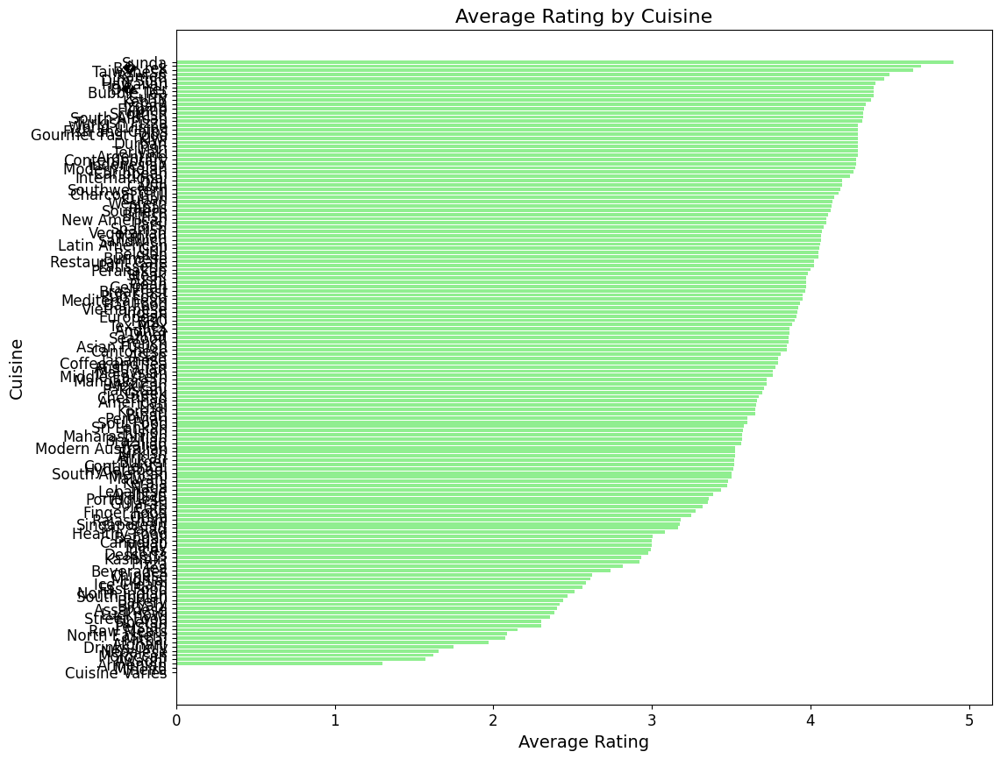

In [53]:
# Split the 'Cuisines' column into separate rows for each cuisine
cuisines_df = df[['Restaurant Name', 'Aggregate rating', 'Cuisines']].copy()
cuisines_df = cuisines_df.assign(Cuisines=cuisines_df['Cuisines'].str.split(',')).explode('Cuisines')

# Clean up any leading or trailing spaces in the 'Cuisines' column
cuisines_df['Cuisines'] = cuisines_df['Cuisines'].str.strip()

# Display the first few rows to verify
print(cuisines_df.head())
# Calculate the average rating for each cuisine
cuisine_rating = cuisines_df.groupby('Cuisines')['Aggregate rating'].mean().reset_index()

# Sort cuisines by average rating
cuisine_rating_sorted = cuisine_rating.sort_values(by='Aggregate rating', ascending=False)

# Display the average ratings for each cuisine
print(cuisine_rating_sorted)
import matplotlib.pyplot as plt

# Plot the average rating by cuisine
plt.figure(figsize=(12, 10))
plt.barh(cuisine_rating_sorted['Cuisines'], cuisine_rating_sorted['Aggregate rating'], color='lightgreen')

# Add labels
plt.xlabel('Average Rating', fontsize=14)
plt.ylabel('Cuisine', fontsize=14)
plt.title('Average Rating by Cuisine', fontsize=16)
plt.gca().invert_yaxis()  # Highest ratings at the top

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.show()


# Level 3
# Task 3 Data Visualization

**Create visualizations to represent the distribution
of ratings using different charts (histogram, bar
plot, etc.).**

1. Histogram: Shows the frequency distribution of ratings.
1. Bar Plot: Useful for comparing average ratings across different categories (e.g., cuisines).
1. Box Plot: Displays the spread and skewness of ratings and highlights outliers.
1. Violin Plot: Provides a detailed view of the distribution shape.
1. KDE Plot: Smoothly estimates the distribution of ratings.

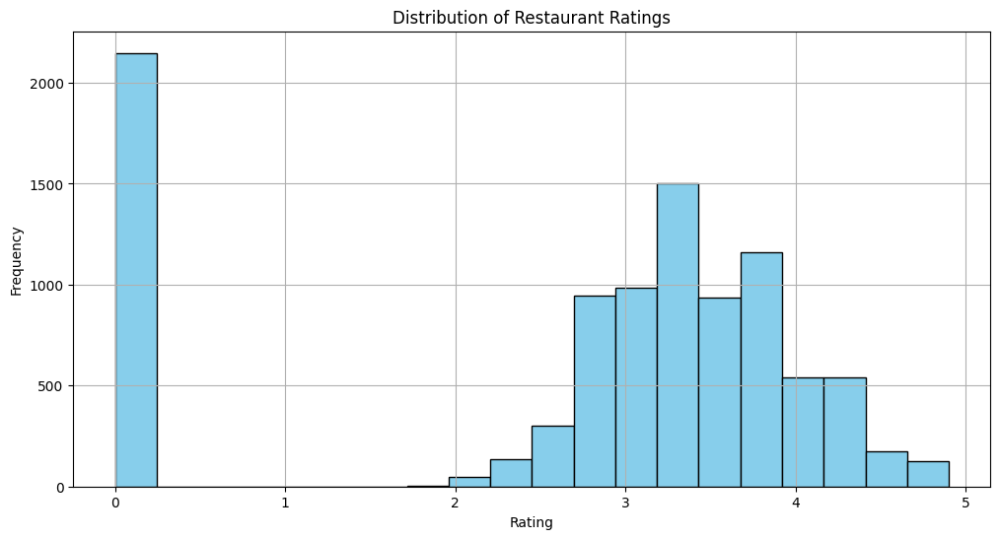

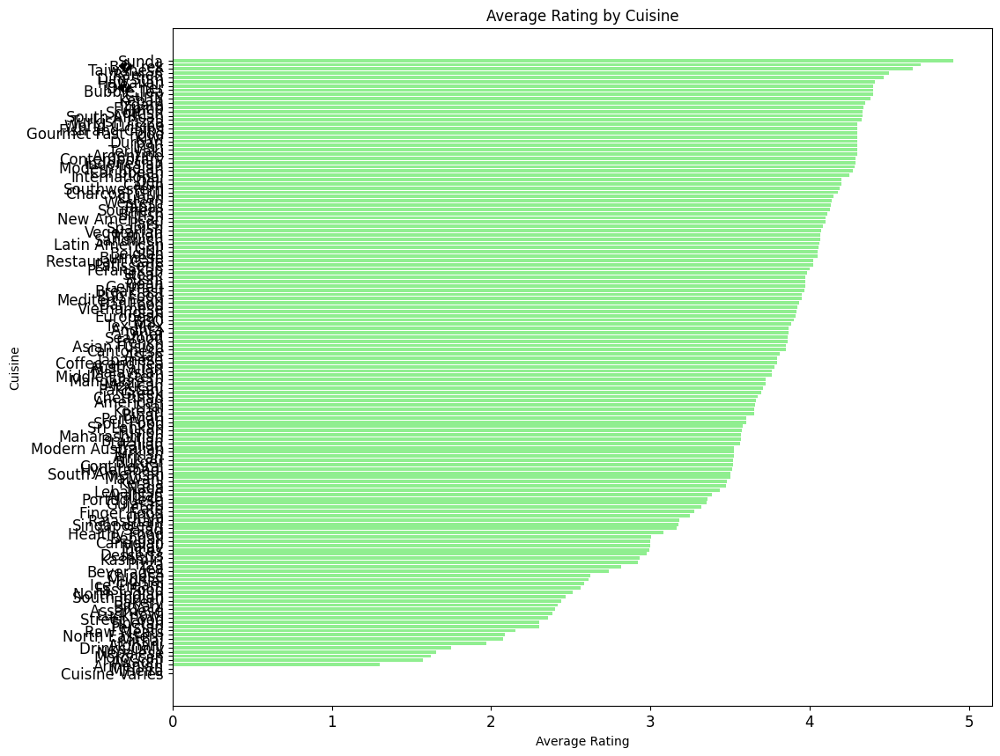

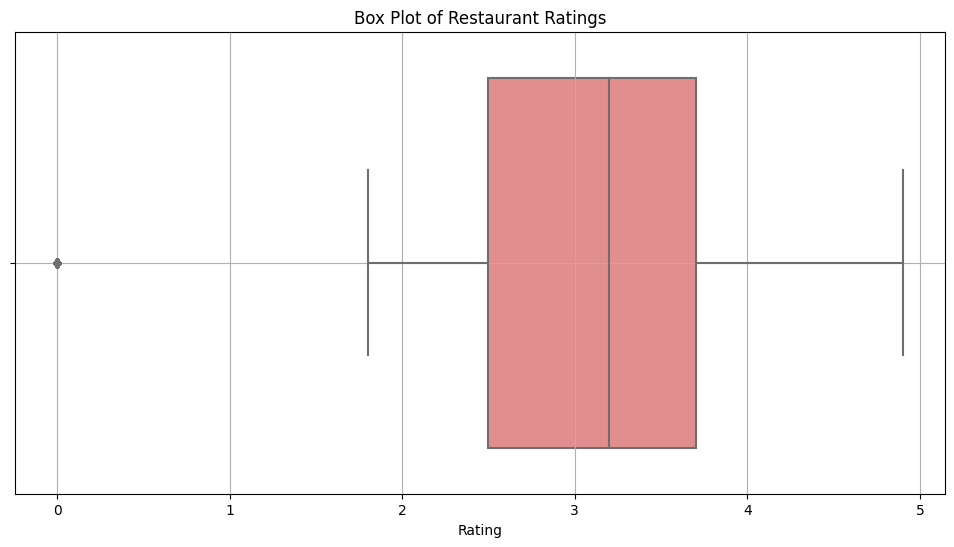

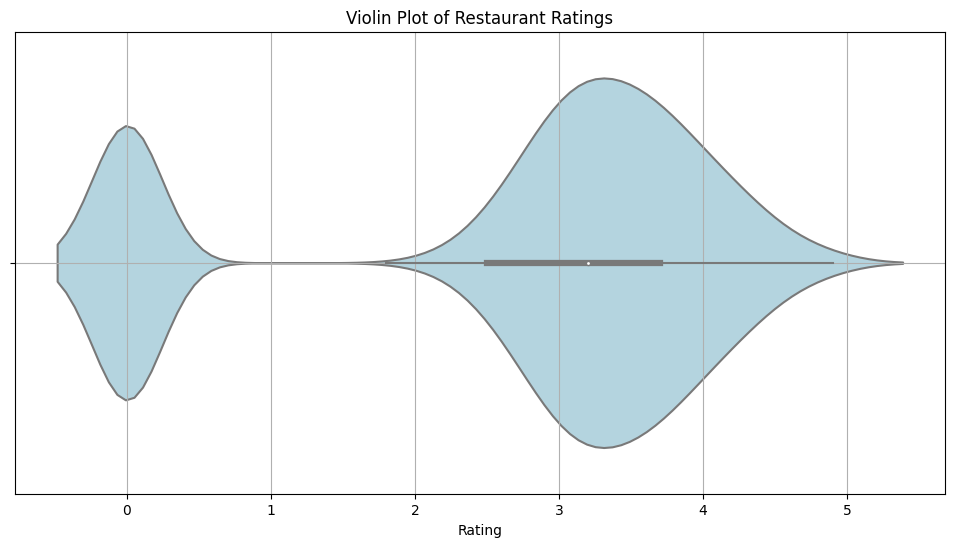

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


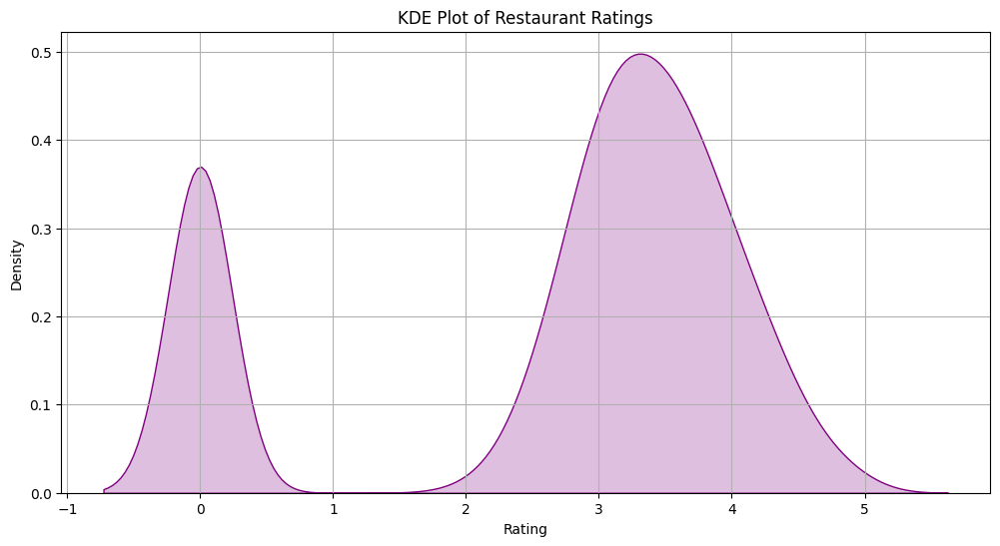

In [54]:
import matplotlib.pyplot as plt

# Plot histogram of ratings
plt.figure(figsize=(12, 6))
plt.hist(df['Aggregate rating'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Restaurant Ratings')
plt.grid(True)
plt.show()
# Calculate average rating for each cuisine (assuming you already have this data)
# cuisine_rating = cuisines_df.groupby('Cuisines')['Aggregate rating'].mean().reset_index()
# cuisine_rating_sorted = cuisine_rating.sort_values(by='Aggregate rating', ascending=False)

# Plot bar plot of average ratings by cuisine
plt.figure(figsize=(12, 10))
plt.barh(cuisine_rating_sorted['Cuisines'], cuisine_rating_sorted['Aggregate rating'], color='lightgreen')
plt.xlabel('Average Rating')
plt.ylabel('Cuisine')
plt.title('Average Rating by Cuisine')
plt.gca().invert_yaxis()  # Highest ratings at the top
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()
import seaborn as sns

# Plot box plot of ratings
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['Aggregate rating'], color='lightcoral')
plt.xlabel('Rating')
plt.title('Box Plot of Restaurant Ratings')
plt.grid(True)
plt.show()
# Plot violin plot of ratings
plt.figure(figsize=(12, 6))
sns.violinplot(x=df['Aggregate rating'], color='lightblue')
plt.xlabel('Rating')
plt.title('Violin Plot of Restaurant Ratings')
plt.grid(True)
plt.show()
# Plot KDE plot of ratings
plt.figure(figsize=(12, 6))
sns.kdeplot(df['Aggregate rating'], fill=True, color='purple')
plt.xlabel('Rating')
plt.ylabel('Density')
plt.title('KDE Plot of Restaurant Ratings')
plt.grid(True)
plt.show()


**Compare the average ratings of different cuisines
or cities using appropriate visualizations**.
1. Bar Plot: Useful for comparing average ratings across different categories (cuisines or cities). Provides a clear visual comparison.
1. Box Plot: Shows the spread, quartiles, and outliers in ratings within each category. Useful for understanding the variability and distribution.

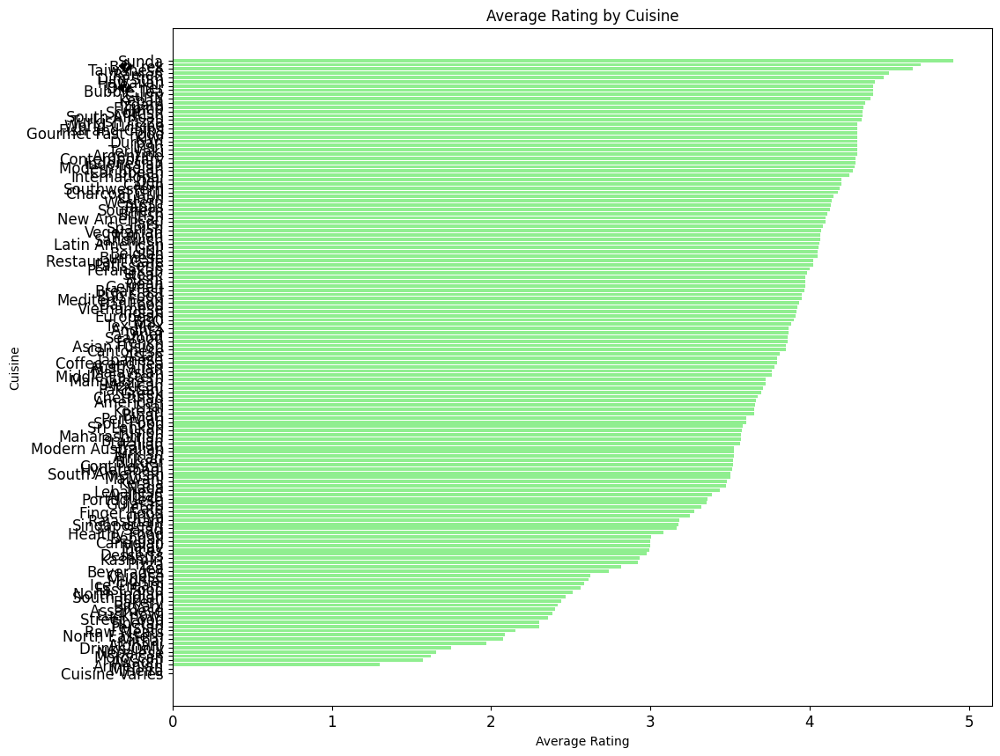

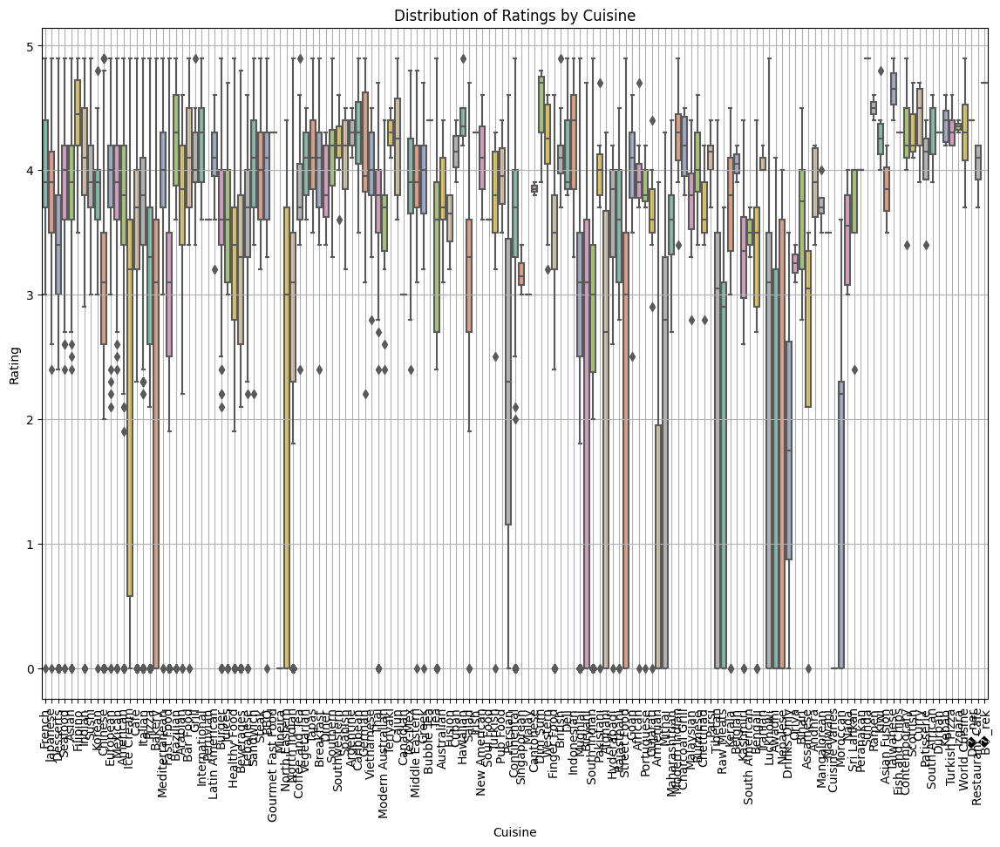

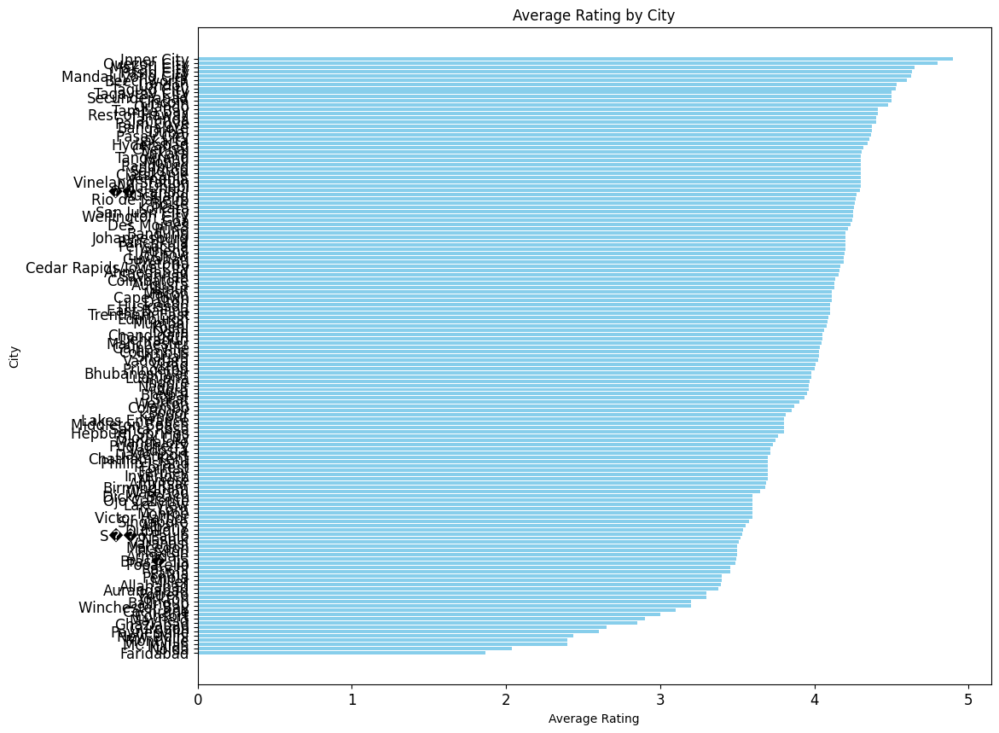

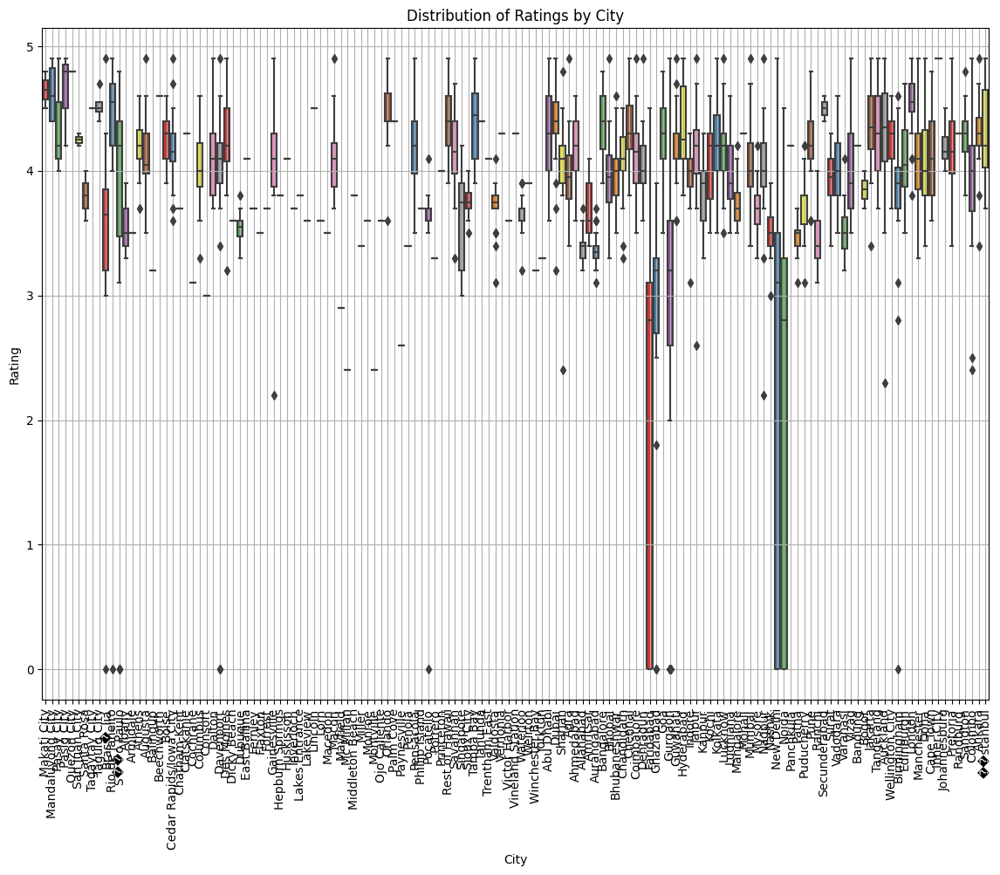

In [55]:
import matplotlib.pyplot as plt

# Assuming you have already calculated average ratings by cuisine
# cuisine_rating_sorted = cuisine_rating.sort_values(by='Aggregate rating', ascending=False)

# Plot bar plot of average ratings by cuisine
plt.figure(figsize=(12, 10))
plt.barh(cuisine_rating_sorted['Cuisines'], cuisine_rating_sorted['Aggregate rating'], color='lightgreen')
plt.xlabel('Average Rating')
plt.ylabel('Cuisine')
plt.title('Average Rating by Cuisine')
plt.gca().invert_yaxis()  # Highest ratings at the top
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()
import seaborn as sns

# Plot box plot of ratings by cuisine
plt.figure(figsize=(14, 10))
sns.boxplot(x='Cuisines', y='Aggregate rating', data=cuisines_df, palette='Set2')
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.xlabel('Cuisine')
plt.ylabel('Rating')
plt.title('Distribution of Ratings by Cuisine')
plt.grid(True)
plt.show()
# Calculate average ratings by city
city_rating = df.groupby('City')['Aggregate rating'].mean().reset_index()
city_rating_sorted = city_rating.sort_values(by='Aggregate rating', ascending=False)

# Plot bar plot of average ratings by city
plt.figure(figsize=(12, 10))
plt.barh(city_rating_sorted['City'], city_rating_sorted['Aggregate rating'], color='skyblue')
plt.xlabel('Average Rating')
plt.ylabel('City')
plt.title('Average Rating by City')
plt.gca().invert_yaxis()  # Highest ratings at the top
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()
# Plot box plot of ratings by city
plt.figure(figsize=(14, 10))
sns.boxplot(x='City', y='Aggregate rating', data=df, palette='Set1')
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.xlabel('City')
plt.ylabel('Rating')
plt.title('Distribution of Ratings by City')
plt.grid(True)
plt.show()


**Visualize the relationship between various
features and the target variable to gain insights.**
1. Scatter Plot: Examines the relationship between two numerical variables.
1. Box Plot: Shows the distribution of ratings across different categories.
1. Violin Plot: Combines box plot and density plot to show distribution and density.
1. KDE Plot: Provides a smooth estimate of the distribution density.
1. Heatmap: Displays correlations between features and the target variable.


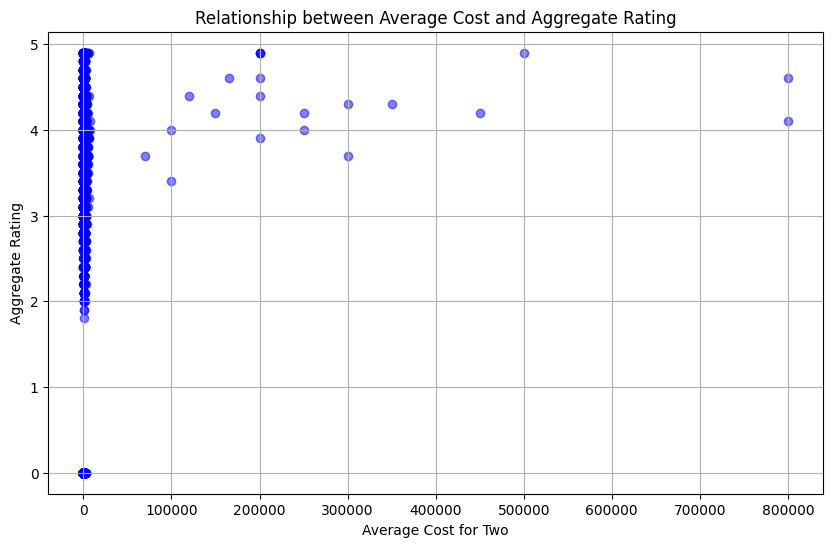

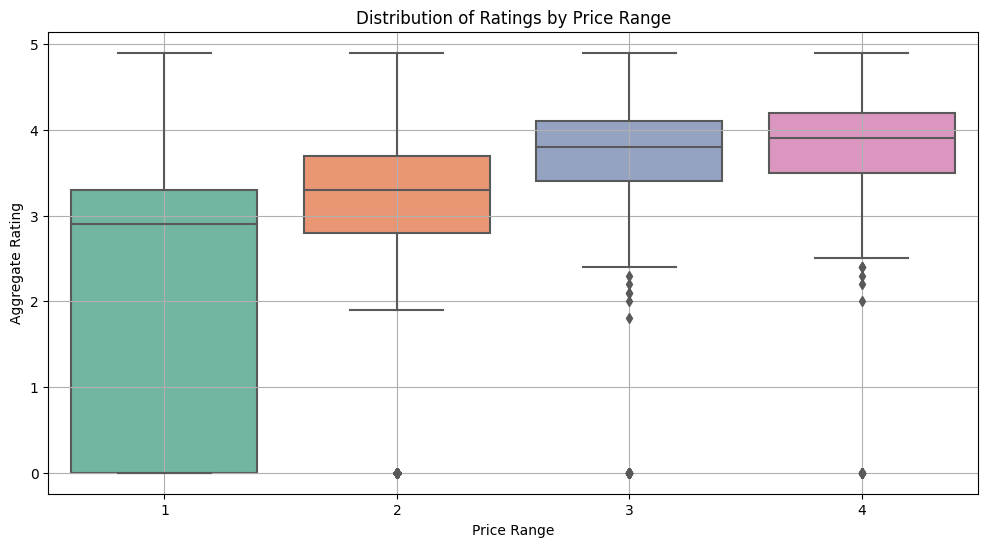

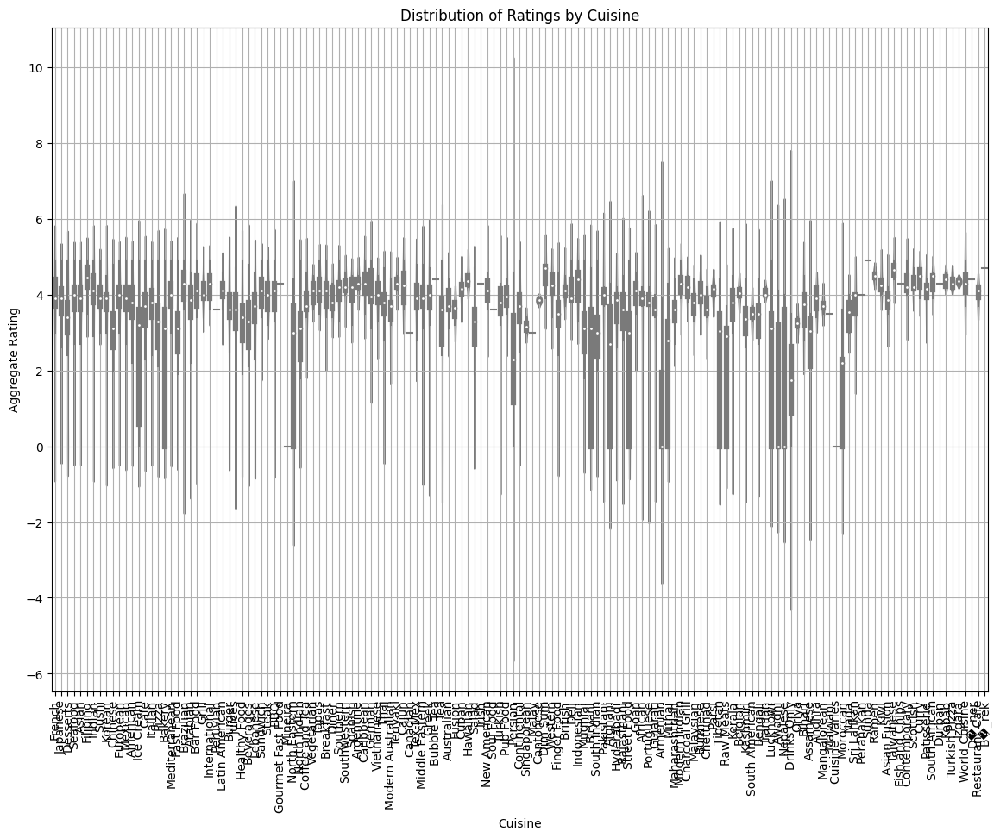

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


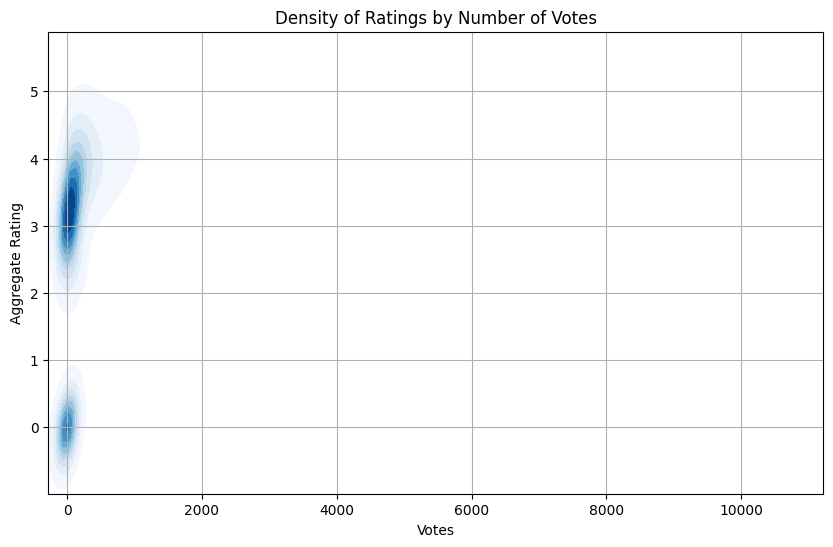

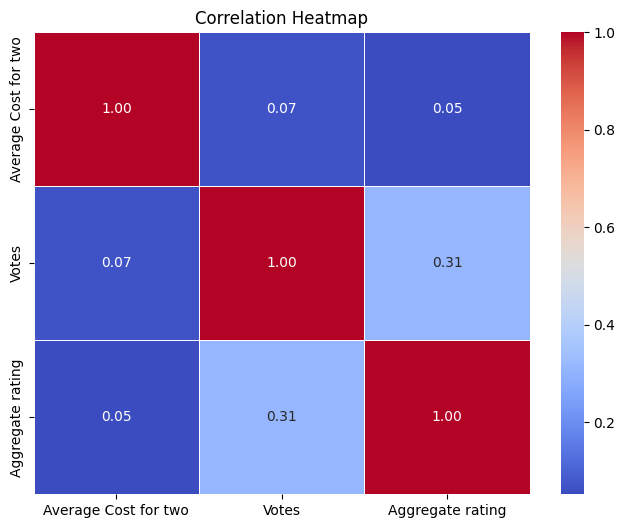

In [56]:
import matplotlib.pyplot as plt

# Plot scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df['Average Cost for two'], df['Aggregate rating'], alpha=0.5, color='blue')
plt.xlabel('Average Cost for Two')
plt.ylabel('Aggregate Rating')
plt.title('Relationship between Average Cost and Aggregate Rating')
plt.grid(True)
plt.show()
import seaborn as sns

# Plot box plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Price range', y='Aggregate rating', data=df, palette='Set2')
plt.xlabel('Price Range')
plt.ylabel('Aggregate Rating')
plt.title('Distribution of Ratings by Price Range')
plt.grid(True)
plt.show()
# Plot violin plot
plt.figure(figsize=(14, 10))
sns.violinplot(x='Cuisines', y='Aggregate rating', data=cuisines_df, palette='Pastel1')
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.xlabel('Cuisine')
plt.ylabel('Aggregate Rating')
plt.title('Distribution of Ratings by Cuisine')
plt.grid(True)
plt.show()
# Plot KDE plot
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df, x='Votes', y='Aggregate rating', cmap='Blues', fill=True)
plt.xlabel('Votes')
plt.ylabel('Aggregate Rating')
plt.title('Density of Ratings by Number of Votes')
plt.grid(True)
plt.show()
import seaborn as sns
import numpy as np

# Calculate correlation matrix
corr_matrix = df[['Average Cost for two', 'Votes', 'Aggregate rating']].corr()

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()
